In [1]:
import cv2
from matplotlib import pyplot as plt
import pandas as pd

In [2]:
df = pd.read_csv("./dataset/dataset.csv")
df

,Path,Label,Note
0,DSC_2701.JPG,1,NaN
1,DSC_2702.JPG,1,NaN
2,DSC_2703.JPG,2,NaN
3,DSC_2704.JPG,2,NaN
4,DSC_2706.JPG,2,NaN
...,...,...,...
117,IMG_9429.jpg,11,NaN
118,IMG_9430.jpg,11,NaN
119,IMG_9432.jpg,3,NaN
120,IMG_9433.jpg,3,NaN


In [3]:
print(len(df['Label']))

122


In [9]:
switch = {
    1: "Suknelė",
    2: "Švarkas",
    3: "Trumpas topas",
    4: "Ilgas topas",
    5: "Sijonas",
    6: "Suknele be rankovių",
    7: "Skarelė",
    8: "Paltas",
    9: "Striuke",
    10: "Marškiniai",
    11: "Kelnės"
}

In [31]:
def get_image_wtih_countours(path):
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret,thresh = cv2.threshold(gray,127,255,1)
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2:]

    for cnt in contours:
        cv2.drawContours(img,[cnt],0,(255,0,255),10)

    return img

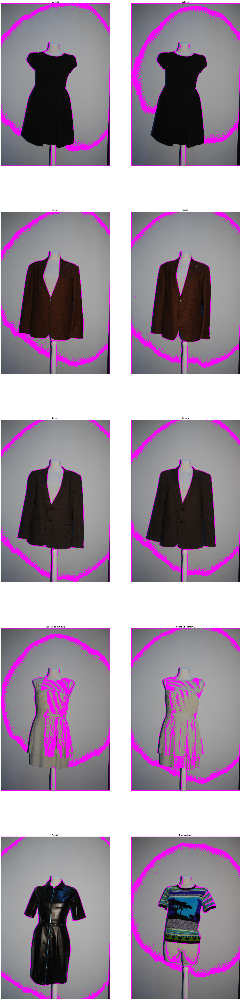

In [32]:
# max 122
 
skip = 0
load = 10
columns = 2

fig = plt.figure(figsize=(28, 121))

rows = int(5)

for i in range(load):
    index = i + skip
    fig.add_subplot(rows, columns, index + 1)
    path = "imgs/" + df['Path'][index]
    plt.imshow(get_image_wtih_countours(path))
    plt.axis('off')
    plt.title(switch.get(int(df['Label'][index])))